In [1]:
import os
import glob
import nibabel as nb
import scipy.stats
from brainspace.mesh.mesh_io import read_surface
from brainspace.plotting import plot_hemispheres
from brainspace.gradient import GradientMaps
from brainspace.mesh.array_operations import smooth_array
import numpy as np
import seaborn as sns
import pandas as pd
import cmocean

In [2]:
# Path to MICAPIPEsurf = mask_5k !
micapipe=os.popen("echo $MICAPIPE").read()[:-1]

# Load native mid surface
inf_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

mask_lh =  nb.load(micapipe + '/surfaces/fsLR-5k.R.mask.shape.gii').darrays[0].data
mask_rh =  nb.load(micapipe + '/surfaces/fsLR-5k.L.mask.shape.gii').darrays[0].data
mask_5k = np.concatenate((mask_lh, mask_rh), axis=0)

# Boolean mask
mask_surf = mask_5k != 0

## Create a brain mask derived from the thickness

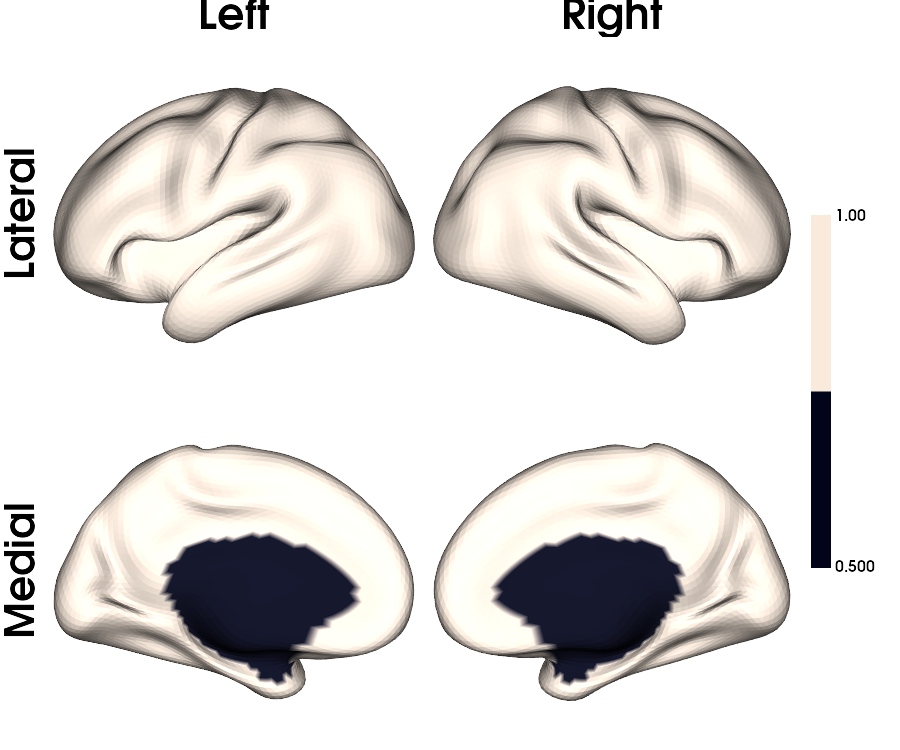

In [3]:
# Set dataset PNI as working directory
os.chdir('/data_/mica3/BIDS_PNI/derivatives/micapipe_v0.2.0')

# Load thickness to make a better mask
lh_files = sorted(glob.glob('sub-PNC*/ses-01/maps/*_hemi-L_surf-fsLR-5k_label-thickness.func.gii'))
rh_files = sorted(glob.glob('sub-PNC*/ses-01/maps/*_hemi-R_surf-fsLR-5k_label-thickness.func.gii'))

# Load all the thickness data
Nth=np.concatenate((nb.load(lh_files[0]).darrays[0].data, nb.load(rh_files[0]).darrays[0].data), axis=0).shape[0]

surf_map=np.empty([len(lh_files), Nth], dtype=float)
for i, _ in enumerate(lh_files):
    surf_map[i,:] = np.hstack(np.concatenate((nb.load(lh_files[i]).darrays[0].data, nb.load(rh_files[i]).darrays[0].data), axis=0))
    # Mean matrix across the x axis (vertices)
    map_mean = np.mean(surf_map, axis=0)

#mask_5k = np.where(map_mean<0.3,False, True)
plot_hemispheres(inf_lh, inf_rh, array_name=mask_5k, cmap='rocket', nan_color=(0, 0, 0, 1),
                              zoom=1.3, size=(900, 750), embed_nb=True,
                              color_bar='right', layout_style='grid', color_range=(0.5,1),
                              label_text={'left': ['Lateral', 'Medial'], 'top': ['Left', 'Right']},
                              screenshot=False)

## fsLR-5k qMRI maps

In [4]:
# load stuff
from brainspace.datasets import load_mask
mask_32k = load_mask(join=True)

inf32_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf32_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

In [5]:
def plot_histogram(data, bins=2000, title='Histogram', cmap='afmhot', Range=(0, 2500),
                   xlim=[0,2500], ylim=2000, mode_value=None, val2=None):
    non_zero_values = data[data != 0]
    n, bins, _ = plt.hist(non_zero_values, bins=bins, color='blue', alpha=0.7)
    bin_centers = (bins[:-1] + bins[1:]) / 2  # Compute the bin centers
    
    colormap = cm.get_cmap(cmap)
    colored_bins = colormap(np.interp(bin_centers, [Range[0], Range[1]], [0, 1]))
    plt.bar(bin_centers, n, width=np.diff(bin_centers[0:2]), color=colored_bins)
    
    plt.title(title)
    plt.xlabel('Intensity Value')
    plt.ylabel('Frequency')

    # Remove the outer box line
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    # Set the grid on the back
    plt.gca().set_axisbelow(True)
    plt.grid(color='gray', linestyle='dashed')

    # Plot a vertical line at the mode value
    if mode_value is not None:
        plt.axvline(x=mode_value[0], color='blue', linestyle='dashed', linewidth=2, label=f'Mode = {mode_value[0]}')
        plt.axvline(x=mode_value[1], color='green', linestyle='dashed', linewidth=2, label=f'Mode = {mode_value[1]}')
    if val2 is not None:
        plt.axvline(x=val2, color='white', linestyle='dashed', linewidth=2, label=f'ModeMRtrix = {val2}')
    
    plt.legend()
    
    # Set x-axis range (adjust as needed)
    plt.xlim(xlim)

    # Set y-axis range (adjust as needed)
    plt.ylim([0, ylim])
    
    plt.show()


In [6]:
# Smooth intencities
def smooth_surf(surf_l, surf_r, points, Mask, Kernel='uniform', Niter=3, Relax=0.35):
    '''
    This function smooth an array (left and right) on a given surface
    Parameters
    ----------
    surf_l : np.array left surface 
    surf_r : np.array right surface
    points : np.array surface data
    Kernel : {'uniform', 'gaussian', 'inverse_distance'}
    Niter  : int, optional Number of smooth iterations
    Relax  : relax : float, optional relaxation factor
    Mask   : str or 1D ndarray, optional
    Returns
    -------
    sdata : smoothed numpy array
    
    '''
    Ndim = Mask.shape[0] 
    n2dim = int(Ndim/2)
    Mask_l=Mask[0:n2dim]
    Mask_r=Mask[n2dim:Ndim]
    sdata = np.concatenate((smooth_array(surf_l, points[0:n2dim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_l), 
                          smooth_array(surf_r, points[n2dim:Ndim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_r)), axis=0)
    return(sdata)

# Smooth each intencity
def smooth_intensities(int_profile):
    smoothed_i = np.copy(int_profile)
   
    # smooth each intensity
    for i in range(int_profile.shape[0]):
        smoothed_i[i,:] = smooth_surf(inf_lh, inf_rh, int_profile[i,:], mask_surf,Niter=5, Relax=0.5, Kernel='uniform')
   
    return(smoothed_i)

In [7]:
def load_qmri_intensity(qmri=''):

    # Load CSV file containing subject and session information
    csv_dir = '/data/mica1/03_projects/youngeun/lists'
    csv_file = f"10PNC_{qmri}.csv"
    subject_session_info = pd.read_csv(csv_dir + '/' + csv_file, header=None, names=['info'], delimiter=',')

    # Extract subject and session information from each row
    files = []
    for index, row in subject_session_info.iterrows():
        info = row['info'].split(',')
        subject = index[4:]  # Extract subject ID
        session = info[0][4:].strip()  # Extract session ID
        file_path = f"sub-{subject}/ses-{session}/mpc-swm/acq-{qmri}/*_surf-fsLR-5k_desc-intensity_profiles.shape.gii"
        files.extend(glob.glob(file_path))
    
    # Print the file paths
    print("Files used:")
    for file_path in files:
        print(file_path)
    
    # Load intensity profiles from each file
    profiles = []
    for file_path in files:
        profile_data = nb.load(file_path).darrays[0].data
        profiles.append(profile_data)
    
    profiles = np.array(profiles)

    # Extract subject and session information
    subjects = set()
    for file_path in files:
        parts = file_path.split('/')
        subject = parts[0][4:]  # Extract subject ID from the directory name
        subjects.add(subject)

    print(f"Intensity Profiles of {qmri} maps - Number of subjects: {len(subjects)}")

    return profiles

In [8]:
def process_qmri_profiles():
    # List of qmri values
    qmri_values = ['T1map', 'MTSAT_protocol', 'T2star', 'FA', 'FOD', 'ODI']
    
    # Initialize variables to store each matrix
    T1map = None
    MTSAT = None
    T2star = None
    FA = None
    fod_tournier_afd = None

    # Load data and store matrices for each qmri value
    for qmri in qmri_values:
        # Load intensity profiles for the given qmri value
        profiles = load_qmri_intensity(qmri)
        # Store the matrix
        if qmri == 'T1map':
            T1map = profiles
        elif qmri == 'MTSAT_protocol':
            MTSAT = profiles
        elif qmri == 'T2star':
            T2star = profiles
        elif qmri == 'FA':
            FA = profiles
        elif qmri == 'FOD':
            fod_tournier_afd = profiles
        elif qmri == 'ODI':
            ODI = profiles

    return T1map, MTSAT, T2star, FA, fod_tournier_afd, ODI

# Call the function to load profiles for each qmri value and store them as matrices
T1map, MTSAT, T2star, FA, FOD, ODI = process_qmri_profiles()

Files used:
sub-PNC003/ses-03/mpc-swm/acq-T1map/sub-PNC003_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC006/ses-03/mpc-swm/acq-T1map/sub-PNC006_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC007/ses-03/mpc-swm/acq-T1map/sub-PNC007_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC009/ses-03/mpc-swm/acq-T1map/sub-PNC009_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC010/ses-03/mpc-swm/acq-T1map/sub-PNC010_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC015/ses-03/mpc-swm/acq-T1map/sub-PNC015_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC016/ses-03/mpc-swm/acq-T1map/sub-PNC016_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC018/ses-03/mpc-swm/acq-T1map/sub-PNC018_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC019/ses-03/mpc-swm/acq-T1map/sub-PNC019_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC022/ses-03/mpc-swm/acq-T1map/sub-PNC022_ses-03_surf-fsLR-5k_desc-intensi

In [9]:
## Average Intensity Profies
# Calculate mean matrix for each dataset
mean_T1map = np.mean(T1map, axis=0)
mean_MTSAT = np.mean(MTSAT, axis=0)
mean_T2star = np.mean(T2star, axis=0)
mean_FA = np.mean(FA, axis=0)
mean_FOD = np.mean(FOD, axis=0)
mean_ODI = np.mean(ODI, axis=0)

# Check the shape of mean matrices
print(f"Mean T1map matrix shape: {mean_T1map.shape}")
print(f"Mean MTSAT matrix shape: {mean_MTSAT.shape}")
print(f"Mean T2star matrix shape: {mean_T2star.shape}")
print(f"Mean FA matrix shape: {mean_FA.shape}")
print(f"Mean FOD matrix shape: {mean_FOD.shape}")
print(f"Mean ODI matrix shape: {mean_ODI.shape}")

Mean T1map matrix shape: (16, 9684)
Mean MTSAT matrix shape: (16, 9684)
Mean T2star matrix shape: (16, 9684)
Mean FA matrix shape: (16, 9684)
Mean FOD matrix shape: (16, 9684)
Mean ODI matrix shape: (16, 9684)


# Plot intensitites

In [10]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm

mean_T1map[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(mean_T1map).any(axis=0)
nmean_T1map = mean_T1map[:, valid_rows]



In [12]:
# Indexing values less than 1600 in the first row
index = nmean_T1map[0:1, :] < 1500

# Sliding nmean_T1map with the index
slided_array = nmean_T1map[:, index.flatten()]

/tmp/ipykernel_872616/1999220321.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap(cmap)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


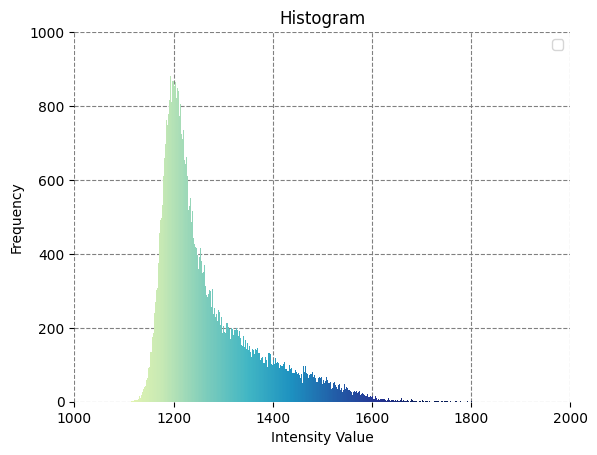

In [13]:
plot_histogram(slided_array, bins=1000, title='Histogram', cmap='YlGnBu', Range=(1000, 1700),
                   xlim=[1000,2000], ylim=1000, mode_value=None, val2=None)

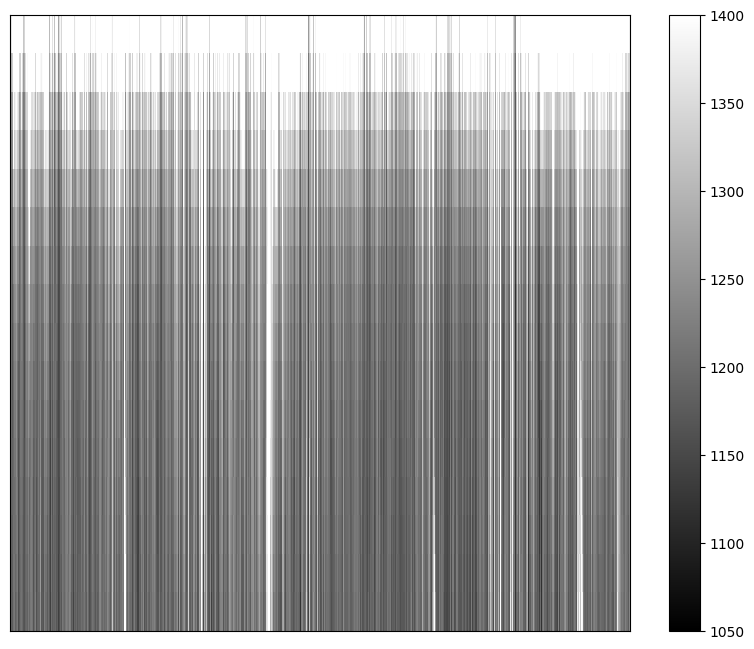

In [14]:
# Adjust the figure size as per your requirement
plt.figure(figsize=(10, 8))  # Adjust the values (width, height) as needed

# Plot the pcolormesh
pcm = plt.pcolormesh(slided_array, cmap='gray', shading='auto', vmin=1050, vmax=1400)

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

In [11]:
def load_mpc(File):
    """Loads and process a MPC"""

    # Load file
    mpc = nb.load(File).darrays[0].data
    
    # Mirror the lower triangle
    mpc = np.triu(mpc,1)+mpc.T
    
    # Replace infinite values with epsilon
    mpc[~np.isfinite(mpc)] = np.finfo(float).eps
    
    # Replace 0 with epsilon
    mpc[mpc==0] = np.finfo(float).eps
    
    # retun the MPC
    return(mpc)

In [12]:
# Set dataset PNI as working directory
os.chdir('/data_/mica3')

subs_pni = ['PNC018', 'PNC019', 'PNC007', 'PNC006', 'PNC003', 'PNC009', 'PNC010', 'PNC015', 'PNC016', 'PNC022']
# Shape of the fsLR-5k matrices
N5k = 9684
dir_pni = 'BIDS_PNI'


# For PNI subjects
dirs_pni = []
for sub in subs_pni:
    dirs_pni.extend(glob.glob(f'{dir_pni}/derivatives/micapipe_v0.2.0/sub-{sub}/ses-03'))

# MPC T1map
qmri='T1map'
mpc_file = []
for path in dirs_pni:
    mpc_file.extend(glob.glob(f'{path}/mpc-swm/acq-{qmri}/*surf-fsLR-5k_desc-MPC.shape.gii'))
N = len(mpc_file) 
print(f"Numer of MPC: {N}") 

# Loads all the MPC fsLR-5k matrices
mpc_5k=np.empty([N5k, N5k, len(mpc_file)], dtype=float)
for i, f in enumerate(mpc_file):
    mpc_5k[:,:,i] = load_mpc(f)
    
# Mean group MPC colums
mpc_5k_mean = np.mean(mpc_5k, axis=2)

mpc_file

Numer of MPC: 10


KeyboardInterrupt: 

In [13]:
def extract_rows(matrix):
    selected_rows = matrix[[0,3, 5, 10, 15], :]
    flip_rows = np.flip(selected_rows, axis=0)
    return flip_rows

## Plotting Ridge Graph (Unsorted)

In [14]:
# plot ridge plot
def plot_ridgeplot(matrix, matrix_df=None, Cmap='rocket', Range=(2.5, 4.5), Xlab="flair", save_path=None, title=None):
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    import matplotlib as mpl

    #mean_row_values = np.mean(matrix, axis=1)
    #sorted_indices = np.argsort(mean_row_values)
    #sorted_matrix = matrix[sorted_indices]
    #sorted_id_x = np.array(matrix_df)[sorted_indices]

    ai = matrix.flatten()
    subject = np.array([])
    id_x = np.array([])

    for i in range(matrix.shape[0]):
        label = np.array([str(i+1) for j in range(matrix.shape[1])])
        subject = np.concatenate((subject, label))
        id_label = np.array([matrix_df[i] for j in range(matrix.shape[1])])
        id_x = np.concatenate((id_x, id_label))

    d = {'feature': ai,
         'subject': subject,
         'id_x': id_x
        }
    df = pd.DataFrame(d)

    f, axs = plt.subplots(nrows=matrix.shape[0], figsize=(3.468504*2.5, 2.220472*3.5), sharex=True, sharey=True)
    f.set_facecolor('none')

    x = np.linspace(Range[0], Range[1], 100)

    for i, ax in enumerate(axs, 1):
        sns.kdeplot(df[df["subject"]==str(i)]['feature'],
                    fill=True,
                    color="w",
                    alpha=0.25,
                    linewidth=1.5,
                    legend=False,
                    ax=ax)
        
        ax.set_xlim(Range[0], Range[1])
        
        im = ax.imshow(np.vstack([x, x]),
                       cmap=Cmap,
                       aspect="auto",
                       extent=[*ax.get_xlim(), *ax.get_ylim()]
                      )
        ax.collections
        path = ax.collections[0].get_paths()[0]
        patch = mpl.patches.PathPatch(path, transform=ax.transData)
        im.set_clip_path(patch)
           
        ax.spines[['left','right','bottom','top']].set_visible(False)
        
        if i != matrix.shape[0]:
            ax.tick_params(axis="x", length=0)
        else:
            ax.set_xlabel(Xlab)
            
        ax.set_yticks([])
        ax.set_ylabel("")
        
        ax.axhline(0, color="black")

        ax.set_facecolor("none")

    for i, ax in enumerate(axs):
        if i == matrix.shape[0] - 1:
            ax.set_xticks([Range[0], Range[1]])  # Set x-axis ticks for the bottom plot
        else:
            ax.set_xticks([])  # Remove x-axis ticks from other plots
        ax.text(0.05, 0.01, matrix_df[i], transform=ax.transAxes, fontsize=10, color='black', ha='left', va='bottom')

    plt.subplots_adjust(hspace=-0.8)
    
    if title:
        plt.suptitle(title, y=0.99, fontsize=16)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    else:
        plt.show()

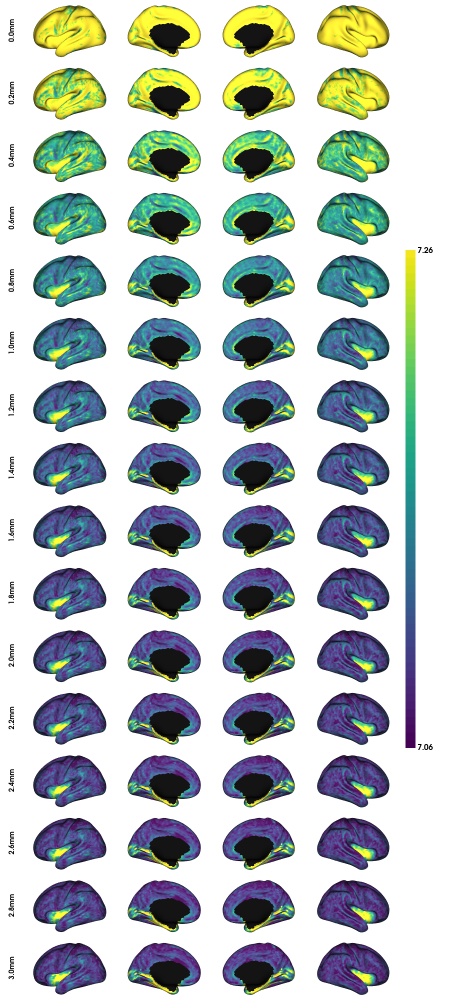

In [19]:
#result_rows = extract_rows(mean_MTSAT) # Change modalities
result_rows = np.flip(np.log(mean_T1map), axis=0)

# Calculate the quantiles for the color range
map_crange=(np.quantile(result_rows[:, mask_5k], 0.001), np.quantile(result_rows[:, mask_5k], 1))
#map_crange=(1077.0804443359375, 1284.8450317382812)

result_rows[:, mask_5k == False] = np.nan

labels=[str(x)+'mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
# Plot with the new color range
plot_hemispheres(inf32_lh, inf32_rh, array_name=result_rows, size=(900, 2000), color_bar='right', zoom=1.5, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='viridis', transparent_bg=False, label_text={'left': labels}, screenshot=False, color_range=map_crange)

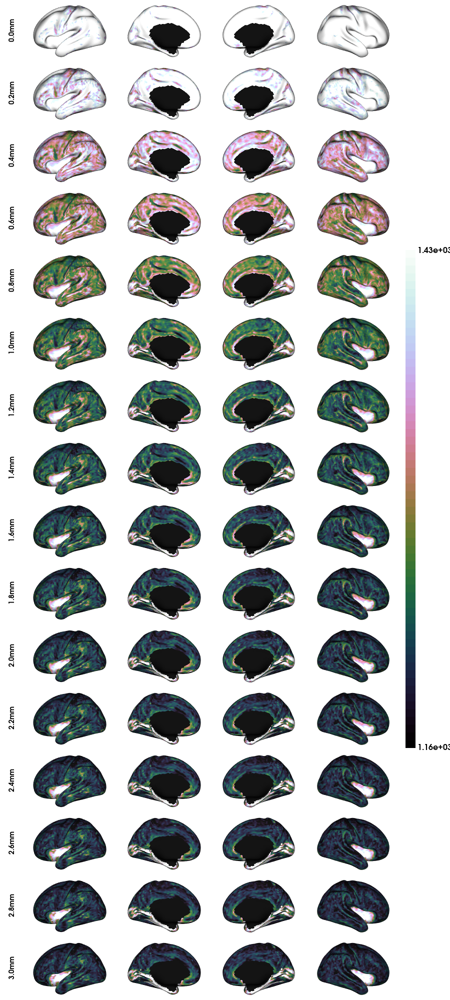

In [20]:
#result_rows = extract_rows(mean_MTSAT) # Change modalities
result_rows = np.flip(mean_T1map, axis=0)

# Calculate the quantiles for the color range
map_crange=(np.quantile(result_rows[:, mask_5k], 0.001), np.quantile(result_rows[:, mask_5k], 1))
#map_crange=(1077.0804443359375, 1284.8450317382812)

result_rows[:, mask_5k == False] = np.nan

labels=[str(x)+'mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
# Plot with the new color range
plot_hemispheres(inf32_lh, inf32_rh, array_name=result_rows, size=(900, 2000), color_bar='right', zoom=1.5, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cubehelix', transparent_bg=False, label_text={'left': labels}, screenshot=False, color_range=map_crange)

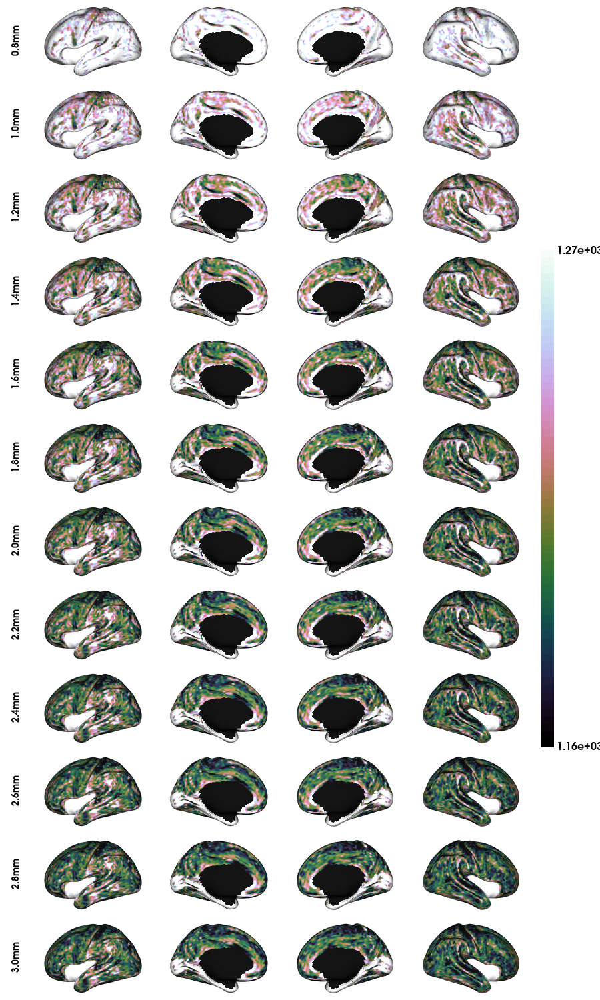

In [190]:
map_crange=(np.quantile(result_rows[:, mask_5k], 0.001), np.quantile(result_rows[:, mask_5k], 0.8))
result_rows=result_rows[4:16]
labels=labels[4:16]

result_rows[:, mask_5k == False] = np.nan
plot_hemispheres(inf32_lh, inf32_rh, array_name=result_rows, size=(900, 1500), color_bar='right', zoom=1.5, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cubehelix', transparent_bg=False, label_text={'left': labels}, screenshot=False, color_range=map_crange)

In [133]:
result_rows[np.isnan(result_rows)] = 0

sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

In [21]:
import cmocean
cmaps = cmocean.cm.cmap_d

### T1map

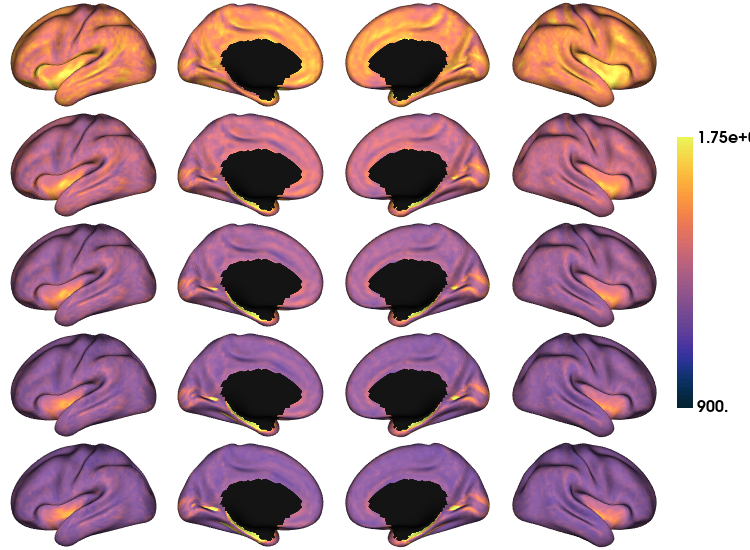

In [33]:
def extract_rows(matrix):
    selected_rows = matrix[[7, 9, 11, 13, 15], :]
    flip_rows = np.flip(selected_rows, axis=0)
    return flip_rows

# Calculate R1 from the T1map
R1 = 1/mean_T1map *1000

# Extract rows for surface plot
result_3rows = extract_rows(mean_T1map) 

# Calculate the quantiles for the color range
result_3rows[:, mask_5k == False] = np.nan
labels=[str(x)+' mm' for x in [0.0, 0.4, 0.8, 1.2, 1.4]]

# Plot with the new color range
plot_hemispheres(inf_lh, inf_rh, array_name=result_3rows, size=(750, 550), color_bar='right', zoom=1.7, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cmo.thermal', transparent_bg=False, screenshot=False, color_range=(900,1750))
#  label_text={'left': labels}

In [25]:
flip_img

array([[0.707557  , 0.7002156 , 0.6717662 , ..., 0.6984112 , 0.6722553 ,
        0.6880268 ],
       [0.73056865, 0.74021   , 0.69871247, ..., 0.74580914, 0.710179  ,
        0.7311023 ],
       [0.75334924, 0.7784921 , 0.72397697, ..., 0.7878454 , 0.7511838 ,
        0.779     ],
       ...,
       [0.8158091 , 0.85724175, 0.8108963 , ..., 0.84110504, 0.82975096,
        0.86309314],
       [0.81852275, 0.860161  , 0.81436855, ..., 0.8395401 , 0.83198524,
        0.8588142 ],
       [0.82341033, 0.8610934 , 0.82012457, ..., 0.84074026, 0.8359632 ,
        0.85185504]], dtype=float32)

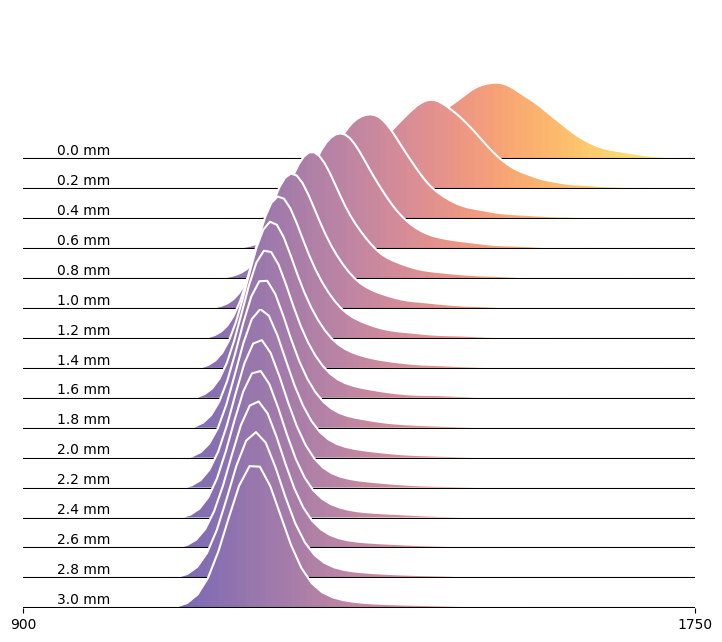

In [40]:
labels = [str(x)+' mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
flip_img = np.flip(mean_T1map, axis=0)
#log_img = np.log(flip_img)

plot_ridgeplot(matrix=flip_img, matrix_df=labels, Cmap='cmo.thermal', Range=(900, 1750), Xlab="")

### MTSAT

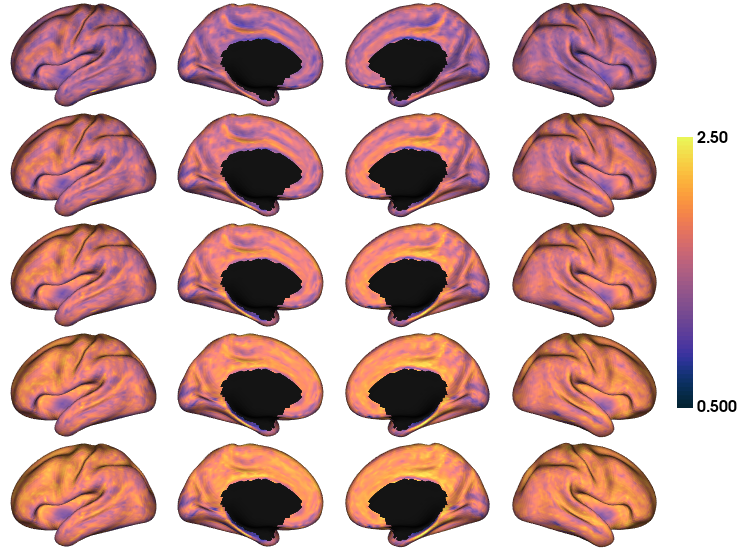

In [36]:
# Extract rows for surface plot
result_3rows = extract_rows(mean_MTSAT) # Change modalities

# Replace midwall with NaN
result_3rows[:, mask_5k == False] = np.nan

# Create labels for surf plot
labels=[str(x)+' mm' for x in [0.0, 0.4, 0.8, 1.2, 1.4]]

# Plot with the new color range
plot_hemispheres(inf_lh, inf_rh, array_name=result_3rows, size=(750, 550), color_bar='right', zoom=1.7, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cmo.thermal', transparent_bg=False, screenshot=False, color_range=(0.5,2.5))


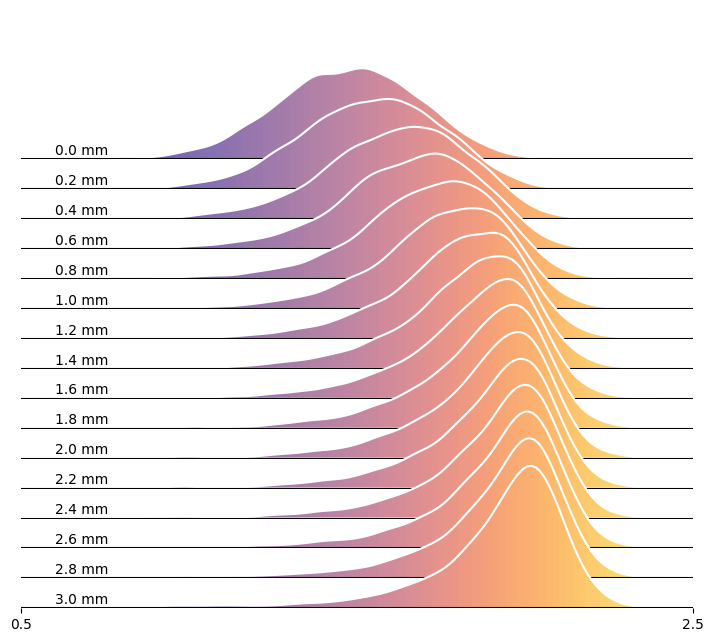

In [38]:
labels = [str(x)+' mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
flip_img = np.flip(mean_MTSAT, axis=0)

flip_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(flip_img).any(axis=0)
flip_img = flip_img[:, valid_rows]

plot_ridgeplot(matrix=flip_img, matrix_df=labels, Cmap='cmo.thermal', Range=(0.5, 2.5), Xlab="")

### T2*

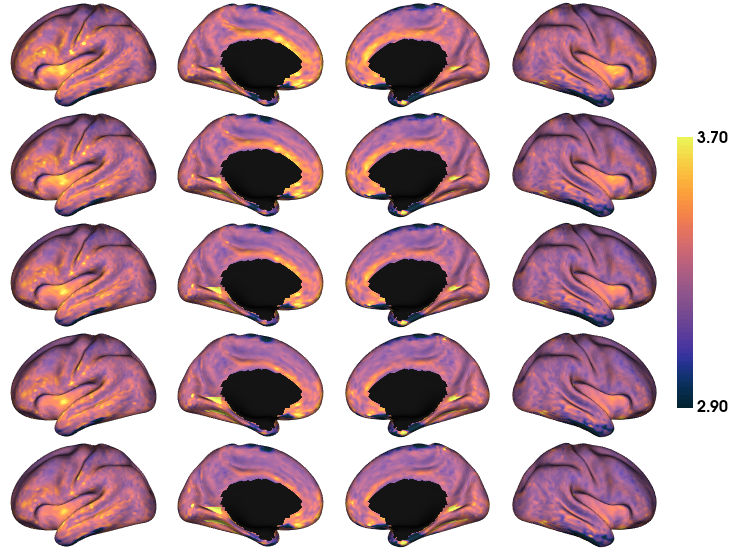

In [344]:
result_3rows = extract_rows(np.log(mean_T2star)) # Change modalities

# Replace midwall with NaN
result_3rows[:, mask_5k == False] = np.nan

# Create labels for surf plot
labels=[str(x)+' mm' for x in [0.0, 0.4, 0.8, 1.2, 1.4]]

# Plot with the new color range
plot_hemispheres(inf_lh, inf_rh, array_name=result_3rows, size=(750, 550), color_bar='right', zoom=1.7, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cmo.thermal', transparent_bg=False, screenshot=False, color_range=(2.9, 3.7))


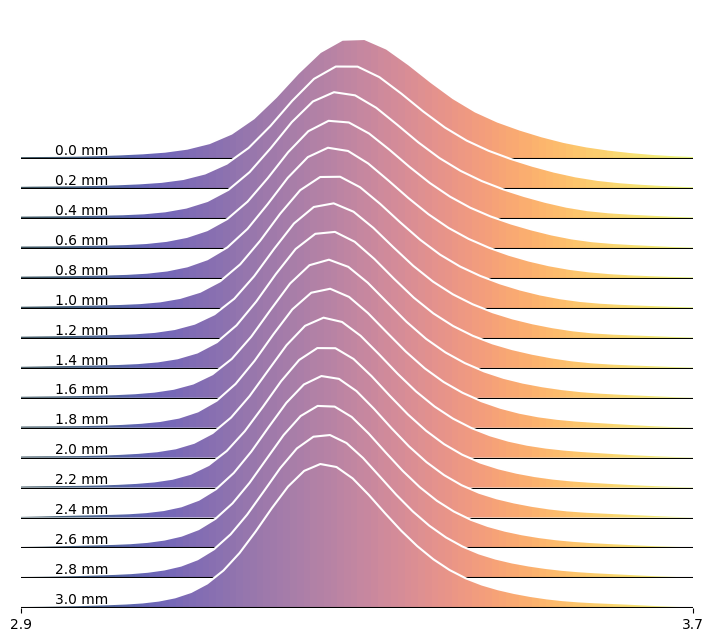

In [333]:
labels = [str(x)+' mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
flip_img = np.flip(mean_T2star, axis=0)
log_img = np.log(flip_img)

plot_ridgeplot(matrix=log_img, matrix_df=labels, Cmap='cmo.thermal', Range=(2.9, 3.7), Xlab="")

### FA

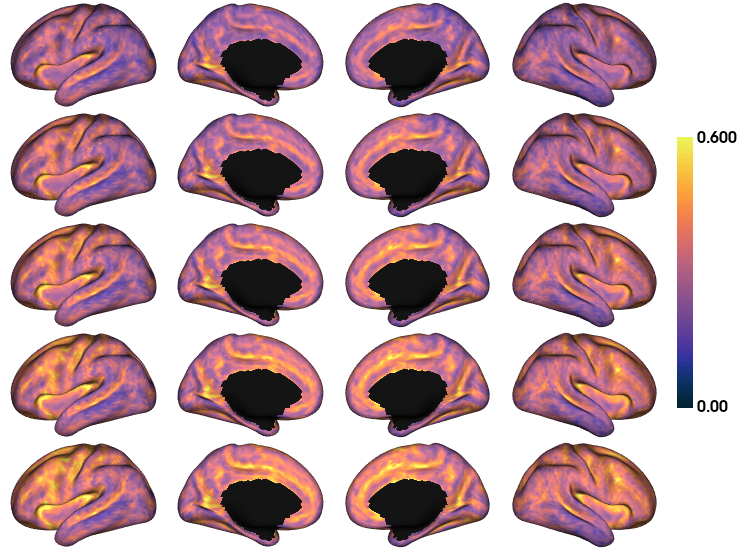

In [345]:
result_3rows = extract_rows(mean_FA) # Change modalities

# Replace midwall with NaN
result_3rows[:, mask_5k == False] = np.nan

# Create labels for surf plot
labels=[str(x)+' mm' for x in [0.0, 0.4, 0.8, 1.2, 1.4]]

# Plot with the new color range
plot_hemispheres(inf_lh, inf_rh, array_name=result_3rows, size=(750, 550), color_bar='right', zoom=1.7, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cmo.thermal', transparent_bg=False, screenshot=False, color_range=(0, 0.6))


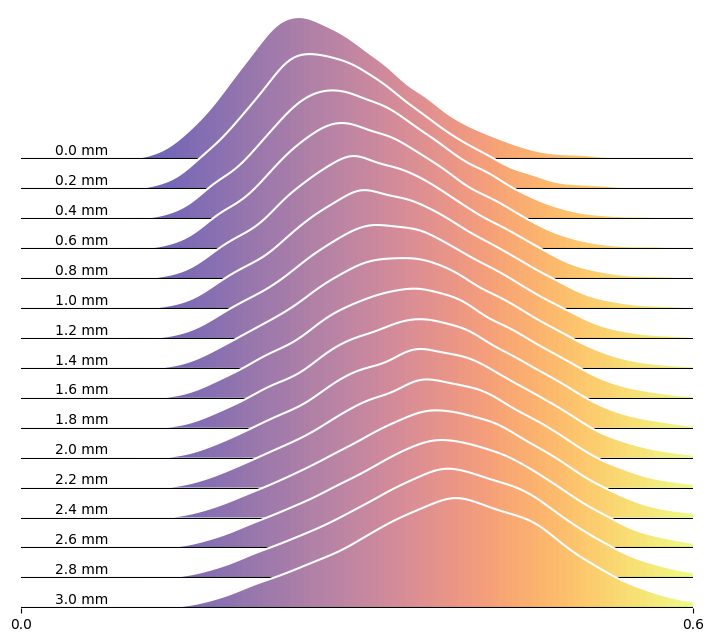

In [230]:
labels = [str(x)+' mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
flip_img = np.flip(mean_FA, axis=0)
flip_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(flip_img).any(axis=0)
flip_img = flip_img[:, valid_rows]

plot_ridgeplot(matrix=flip_img, matrix_df=labels, Cmap='cmo.thermal', Range=(0, 0.6), Xlab="")

### FOD

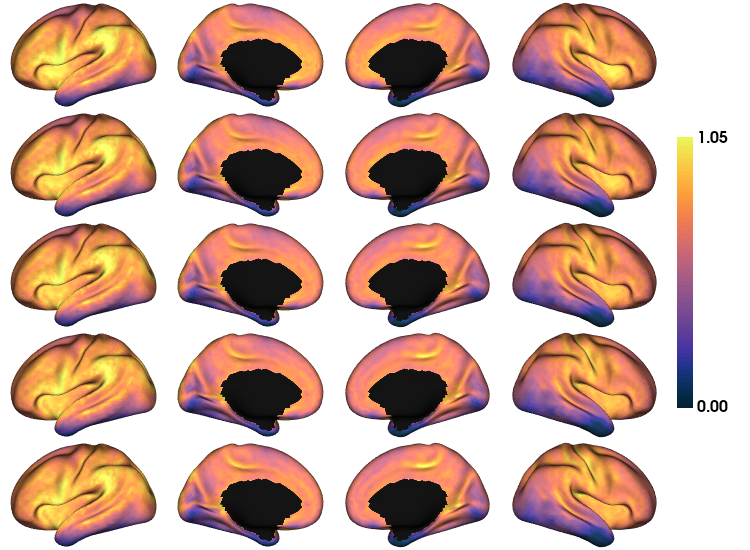

In [346]:
result_3rows = extract_rows(mean_FOD) # Change modalities

# Replace midwall with NaN
result_3rows[:, mask_5k == False] = np.nan

# Create labels for surf plot
labels=[str(x)+' mm' for x in [0.0, 0.4, 0.8, 1.2, 1.4]]

# Plot with the new color range
plot_hemispheres(inf_lh, inf_rh, array_name=result_3rows, size=(750, 550), color_bar='right', zoom=1.7, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cmo.thermal', transparent_bg=False, screenshot=False, color_range=(0, 1.05))


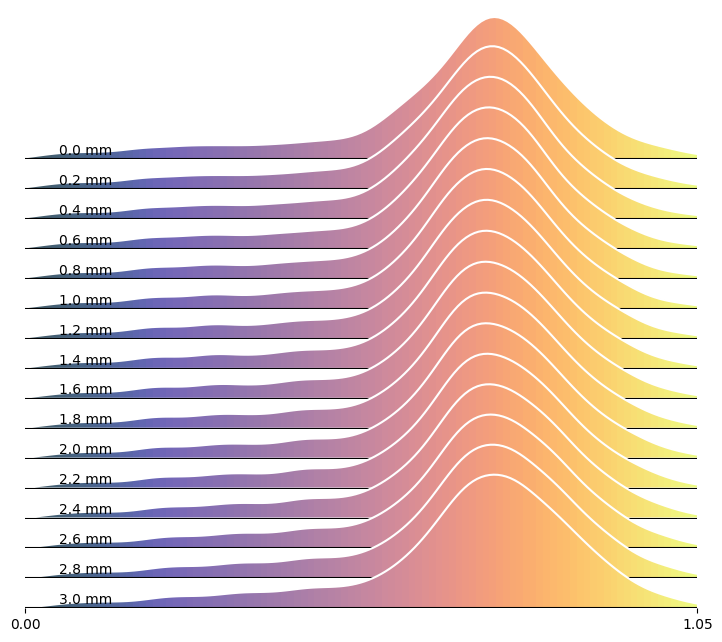

In [339]:
labels = [str(x)+' mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
flip_img = np.flip(mean_FOD, axis=0)
flip_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(flip_img).any(axis=0)
flip_img = flip_img[:, valid_rows]

plot_ridgeplot(matrix=flip_img, matrix_df=labels, Cmap='cmo.thermal', Range=(0, 1.05), Xlab="")

### ODI

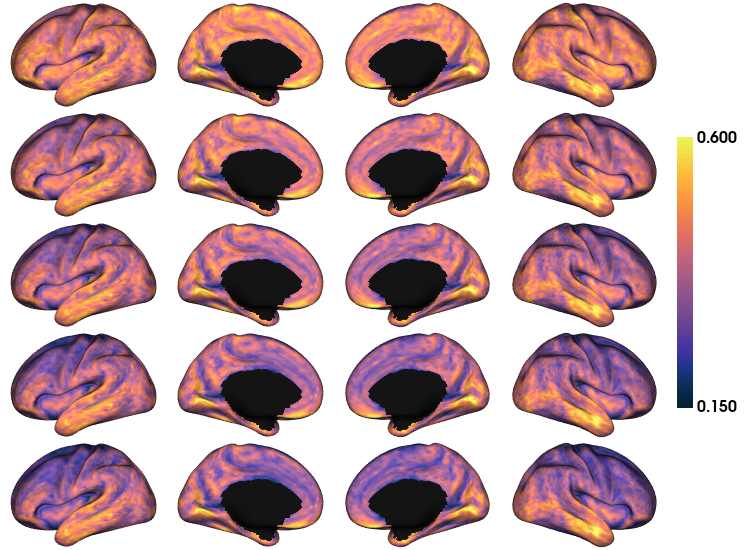

In [347]:
result_3rows = extract_rows(mean_ODI) # Change modalities

# Replace midwall with NaN
result_3rows[:, mask_5k == False] = np.nan

# Create labels for surf plot
labels=[str(x)+' mm' for x in [0.0, 0.4, 0.8, 1.2, 1.4]]

# Plot with the new color range
plot_hemispheres(inf_lh, inf_rh, array_name=result_3rows, size=(750, 550), color_bar='right', zoom=1.7, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cmo.thermal', transparent_bg=False, screenshot=False, color_range=(0.15, 0.6))


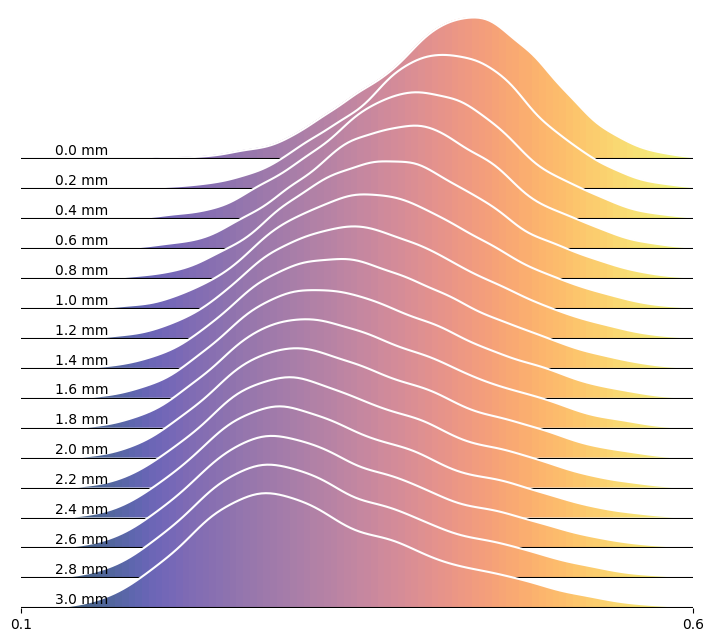

In [246]:
labels = [str(x)+' mm' for x in [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]]
flip_img = np.flip(mean_ODI, axis=0)
flip_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(flip_img).any(axis=0)
flip_img = flip_img[:, valid_rows]

plot_ridgeplot(matrix=flip_img, matrix_df=labels, Cmap='cmo.thermal', Range=(0.1, 0.6), Xlab="")